<h1><center> Energy Useage </center></h1>

## Import libraries and data

In [1]:
# for data handling
import numpy as np
import pandas as pd

# for static graphs
import matplotlib.pyplot as plt
import seaborn as sns
 
# for interactive graphs
import plotly_express as px


In [2]:
# Codes for extracting plotly graphs
#import chart_studio

#username = xxx
#api_key = xxxx

#chart_studio.tools.set_credentials_file(username=username, api_key= api_key )
#import chart_studio.plotly as py
#import chart_studio.tools as tls

source data : https://www.fao.org/faostat/en/#data/GN

In [3]:
# import data 
energy = pd.read_csv("energy_use_data_11-29-2021.csv")

# Clean data - exclude unnecessary data and make minor alterations for improved readability

x = ["Year Code", "Domain Code", "Domain", "Element Code", "Element", "Item Code", "Flag", ]
energy.drop( x, inplace = True, axis =1)
energy.drop( energy[energy["Flag Description"]=="Aggregate, may include official, semi-official, estimated or calculated data"].index, inplace = True, axis =0)
energy.rename(columns = {"Area": "Country"}, inplace = True)

energy.drop( energy[energy["Year"].isin([1970, 2019])].index, inplace = True, axis =0)


#Transforming the dataset for use later in the project
energy["Country"].replace("United Kingdom of Great Britain and Northern Ireland", "UK", inplace= True)
energy["Country"].replace("United States of America", "USA", inplace= True)


energy.head()

,Area Code (ISO3),Country,Item,Year,Unit,Value,Flag Description
0,AFG,Afghanistan,Gas-Diesel oil,1990,kilotonnes,231.4918,FAO estimate
1,AFG,Afghanistan,Gas-Diesel oil,1991,kilotonnes,188.5317,FAO estimate
2,AFG,Afghanistan,Gas-Diesel oil,1992,kilotonnes,47.9904,FAO estimate
3,AFG,Afghanistan,Gas-Diesel oil,1993,kilotonnes,38.6116,FAO estimate
4,AFG,Afghanistan,Gas-Diesel oil,1994,kilotonnes,31.4465,FAO estimate


## Establish frequently used functions 

In [4]:
# Restructure the data by grouping variables 
def restructure_data (Dataset, GroupbyVariable,Value):
    Overview = Dataset.groupby(GroupbyVariable)[Value].median().reset_index()
    return Overview

In [5]:
#Extracts a the earliest/ oldest data in the dataset 
def extract_values(Dataset, function):
    if function == "min":
        return Dataset[Dataset["Year"] == Dataset["Year"].min()].reset_index()
    elif function == "max":
        return Dataset[Dataset["Year"] == Dataset["Year"].max()].reset_index()
    else:
        print("incorrect function")

In [6]:
#Compares the oldest/latest data against one another 
def comparison_of_min_max(dataset):
    Min = dataset[dataset["Year"] == dataset["Year"].min()]
    Min = Min.groupby("Item")["Value"].median()

    Max = dataset[dataset["Year"] == dataset["Year"].max()]
    Max = Max.groupby("Item")["Value"].median()

    Difference = Max-Min
    Difference =Difference.reset_index().rename(columns = {"index": "Item", 0:"Value"}).fillna(0)
    return Difference

In [7]:
#Extracts a cross section of the data based for specific country(s) 
def extract_country_data (Country_list, Dataset):
    extracted_data = Dataset[Dataset["Country"].isin(Country_list)]
    return extracted_data

## Global energy emissions

In [8]:
#Restructure data for visualisation
energy_group = restructure_data(energy, "Year", "Value")

#Construct visualisation 
fig = px.line(energy_group, x = "Year", y = "Value", title = "Global energy usage in average CO2 emissions (interactive)" )

#customisation
fig.update_xaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')
fig.update_yaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')

fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
}, showlegend = False)


fig.add_annotation(text = ("Source: https://www.fao.org/faostat/en/#data/GN <br>Median average used due to extreme outliers"),
                   showarrow = False, x = 0, y = -.30, xref= "paper", yref= "paper", xanchor = "left", yanchor = "bottom", xshift =-1,
                    yshift =-5, font = dict(size =10, color = "grey"), align = "left")


#extracting plotly graphs 
#py.plot(fig, filename = "Global energy usage in average CO2 emissions (interactive)", auto_open = False)

fig.show()

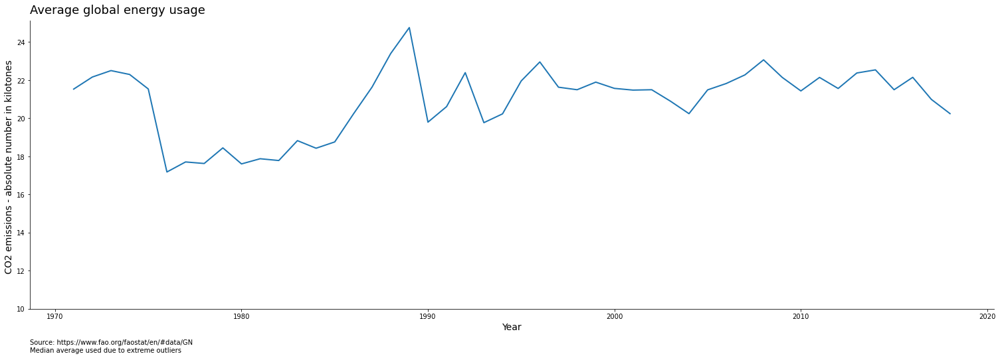

In [9]:
#using the transformed data from plotly graph to create a static version

#Construct visualisation 
plt.figure(figsize = (26,8))
sns.lineplot(x = "Year", y = "Value", data = energy_group, lw= 2)

#Customisation
plt.title("Average global energy usage", fontsize = 18, loc='left', y=1.01 )

plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN \nMedian average used due to extreme outliers', (0,-.15), xycoords ='axes fraction' )
plt.ylim(10,)

sns.despine(top = True, right = True, left = False, bottom = False)
plt.xlabel("Year", fontsize=14)
plt.ylabel("CO2 emissions - absolute number in kilotones ", fontsize=14)


plt.show()

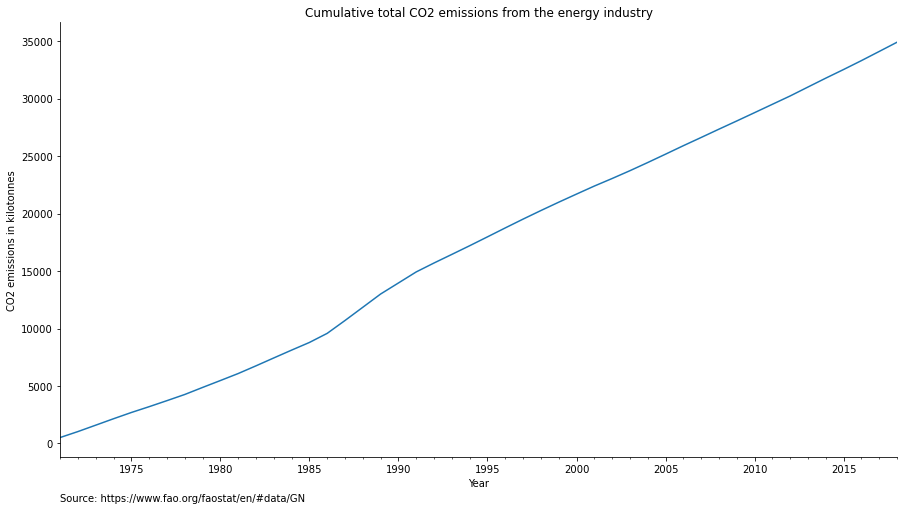

In [10]:
#Restructure data for visualisation

energy_copy = energy.copy()

energy_copy["Year"] = pd.to_datetime(energy_copy["Year"], format = "%Y")
energy_copy = pd.pivot_table(energy_copy, values='Value', index=["Year"]) 


#Construct visualisation 
ax = energy_copy["Value"].expanding().sum().plot(figsize = (15,8), title = "Cumulative total CO2 emissions from the energy industry")

#Customisation
sns.despine(top = True, right = True, left = False, bottom = False)

ax.set_ylabel("CO2 emissions in kilotonnes")
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN', (0,-.1), xycoords ='axes fraction')
plt.show()

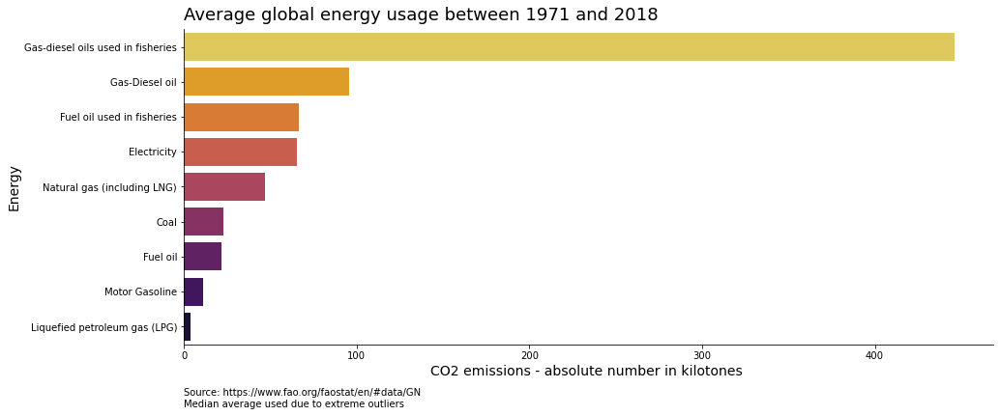

In [11]:
#Restructure data for visualisation
overall_avg = restructure_data(energy, "Item", "Value")

#Construct visualisation 
plt.figure(figsize = (15,6))
sns.barplot(y = "Item", x = "Value", data = overall_avg, order = overall_avg.sort_values("Value", ascending= False)["Item"], palette = "inferno_r")

#customisation
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN \nMedian average used due to extreme outliers', (0,-.2), xycoords ='axes fraction' )
sns.despine(top = True, right = True, left = False, bottom = False)
plt.title("Average global energy usage between 1971 and 2018", fontsize = 18, loc='left', y=1.01  )

plt.ylabel("Energy", fontsize=14)
plt.xlabel("CO2 emissions - absolute number in kilotones ", fontsize=14)

plt.show()

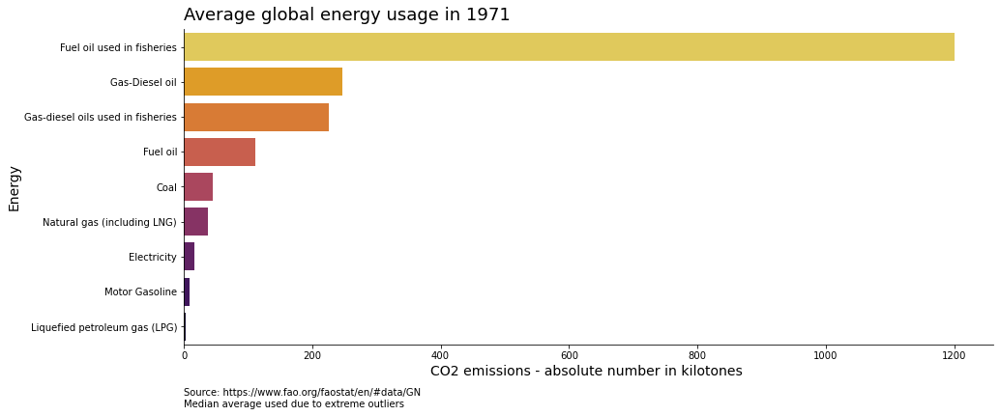

In [12]:
#Restructure data for visualisation
min_data = extract_values(Dataset = energy, function = "min")
min_data_index = restructure_data(min_data, "Item", "Value")
 

#Construct visualisation 
plt.figure(figsize = (15,6))
sns.barplot(y = "Item", x = "Value", data = min_data_index, order = min_data_index.sort_values("Value", ascending= False)["Item"], palette = "inferno_r")

#customisation
plt.title("Average global energy usage in 1971", fontsize = 18, loc='left', y=1.01 )
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN \nMedian average used due to extreme outliers', (0,-.2), xycoords ='axes fraction' )
sns.despine(top = True, right = True, left = False, bottom = False)
plt.ylabel("Energy", fontsize=14)
plt.xlabel("CO2 emissions - absolute number in kilotones ", fontsize=14)


plt.show()

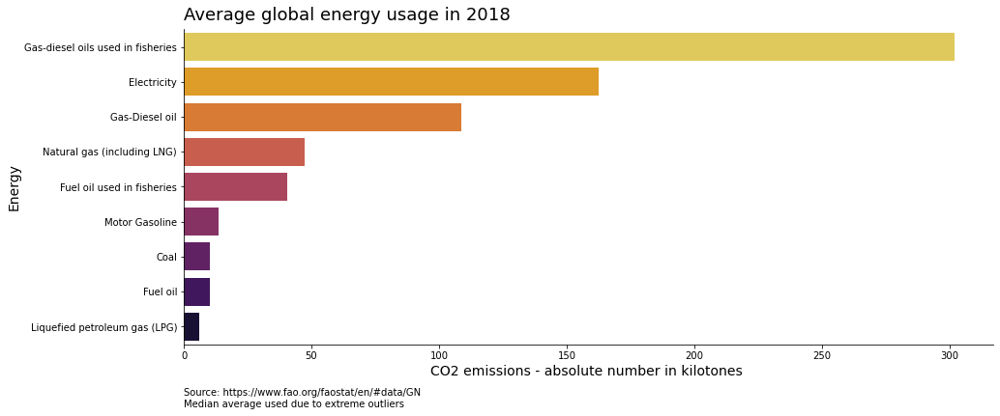

In [13]:
#Restructure data for visualisation
max_data = extract_values(Dataset = energy, function = "max")
max_data_index = restructure_data(max_data, "Item", "Value")


#Construct visualisation 
plt.figure(figsize = (15,6))
sns.barplot(y = "Item", x = "Value", data = max_data_index, order = max_data_index.sort_values("Value", ascending= False)["Item"], palette = "inferno_r")

#customisation
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN \nMedian average used due to extreme outliers', (0,-.2), xycoords ='axes fraction' )
sns.despine(top = True, right = True, left = False, bottom = False)

plt.ylabel("Energy", fontsize=14)
plt.xlabel("CO2 emissions - absolute number in kilotones ", fontsize=14)
plt.title("Average global energy usage in 2018", fontsize = 18, loc='left', y=1.01 )

plt.show()

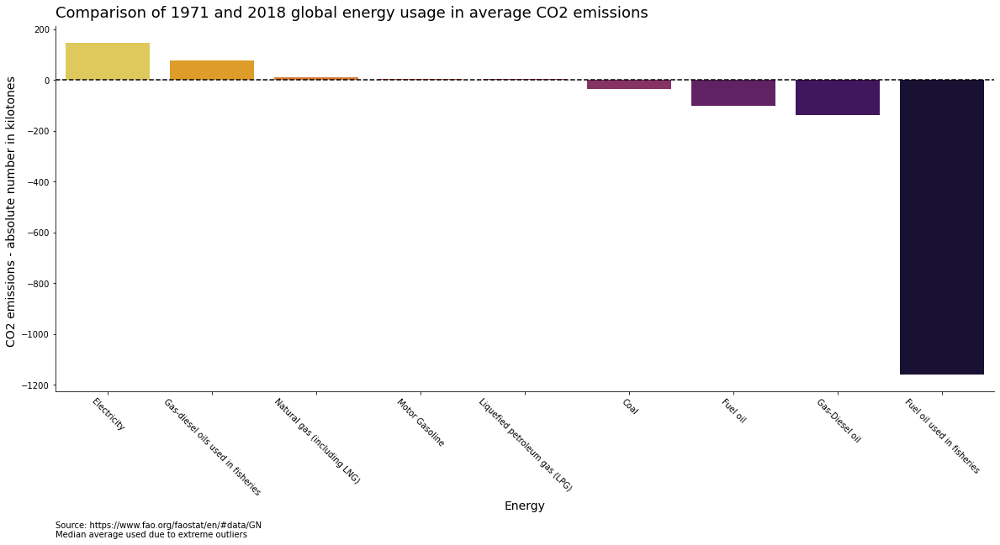

In [14]:
#Restructure data for visualisation using previously manipulated data
comparison = comparison_of_min_max(energy)

#Construct visualisation 
plt.figure(figsize= (20,8))
sns.barplot(x = "Item", y = "Value", data = comparison, order = comparison.sort_values("Value", ascending= False)["Item"], palette = "inferno_r")

#customisation
plt.axhline(0, ls = "--", color = "black")
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN \nMedian average used due to extreme outliers', (0,-.4), xycoords ='axes fraction' )
sns.despine(top = True, right = True, left = False, bottom = False)
plt.xticks(rotation=-45)

plt.xlabel("Energy", fontsize=14)
plt.ylabel("CO2 emissions - absolute number in kilotones ", fontsize=14)


plt.title("Comparison of 1971 and 2018 global energy usage in average CO2 emissions", fontsize = 18, loc='left', y=1.01 )
plt.show()

In [15]:
#Construct visualisation 
fig= px.bar(comparison, x = "Item", y = "Value", title ="Comparison of 1971 and 2018 global energy usage in average CO2 emissions (interactive)").update_xaxes(categoryorder = "total descending")

#customisation
fig.add_hline(0, line_width = 2, line_dash = "dot")
fig.update_xaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')
fig.update_yaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')

fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
}, showlegend = False)


fig.add_annotation(text = ("Source: https://www.fao.org/faostat/en/#data/GN <br>Median average used due to extreme outliers"),
                   showarrow = False, x = 0, y = -.5, xref= "paper", yref= "paper", xanchor = "left", yanchor = "bottom", xshift =-1,
                    yshift =-5, font = dict(size =10, color = "grey"), align = "left")
fig.show()

## Energy fluctuations over time 

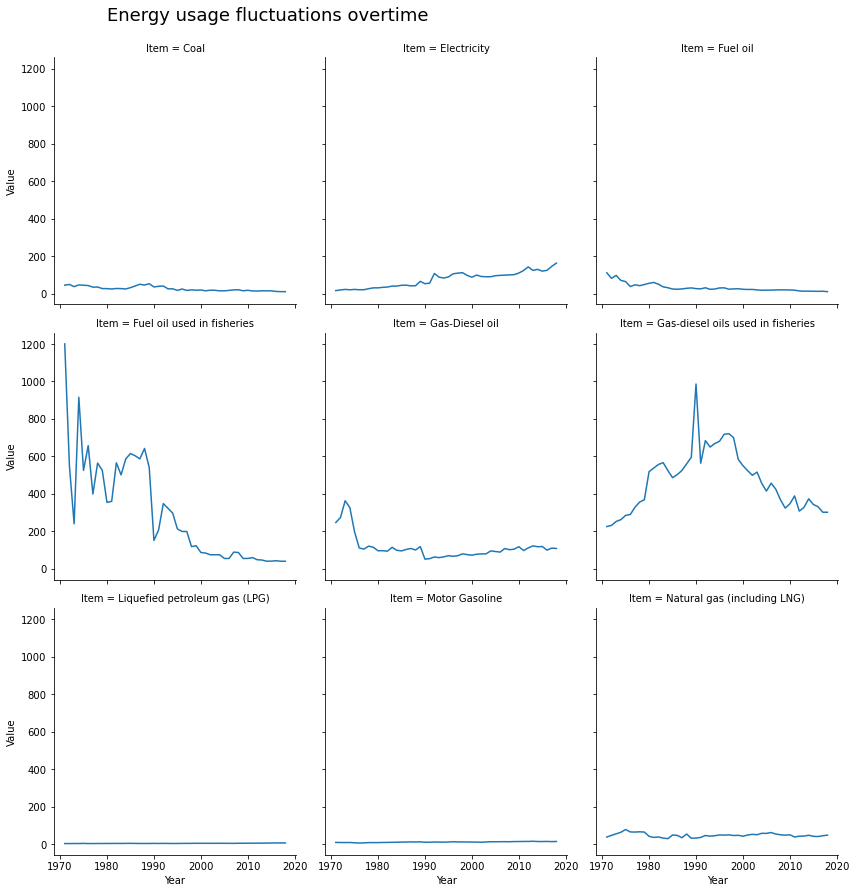

In [16]:
#Restructure data for visualisation
overall_fluctuations = restructure_data(energy,["Year", "Item"], "Value")

#Construct visualisation 
g= sns.FacetGrid(data = overall_fluctuations, col = "Item", col_wrap = 3, height = 4,)
g.map(sns.lineplot, "Year", "Value",)
g.fig.suptitle('Energy usage fluctuations overtime',fontsize = 18, horizontalalignment='right', y = 1.03)
plt.show()

In [17]:
#Construct visualisation 
fig = px.line(overall_fluctuations, x = "Year", y = "Value", facet_col = "Item", facet_row_spacing=0.04, facet_col_wrap=2, 
              width=800, height=2000, title = "Global energy usage in average CO2 emissions separated by energy" )

#customisation
fig.update_xaxes(matches = None, showline=True, linewidth=1, linecolor='black')
fig.update_yaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
}, showlegend = False)
    
    
fig.add_annotation(text = ("Source: https://www.fao.org/faostat/en/#data/GN <br>Median average used due to extreme outliers"),
                   showarrow = False, x = 0, y = -.3, xref= "paper", yref= "paper", xanchor = "left", yanchor = "bottom", xshift =-1,
                    yshift =-5, font = dict(size =10, color = "grey"), align = "left")

#extracting plotly graphs 
#py.plot(fig, filename = "Global energy usage in average CO2 emissions separated by energy", auto_open = False)

fig.show()

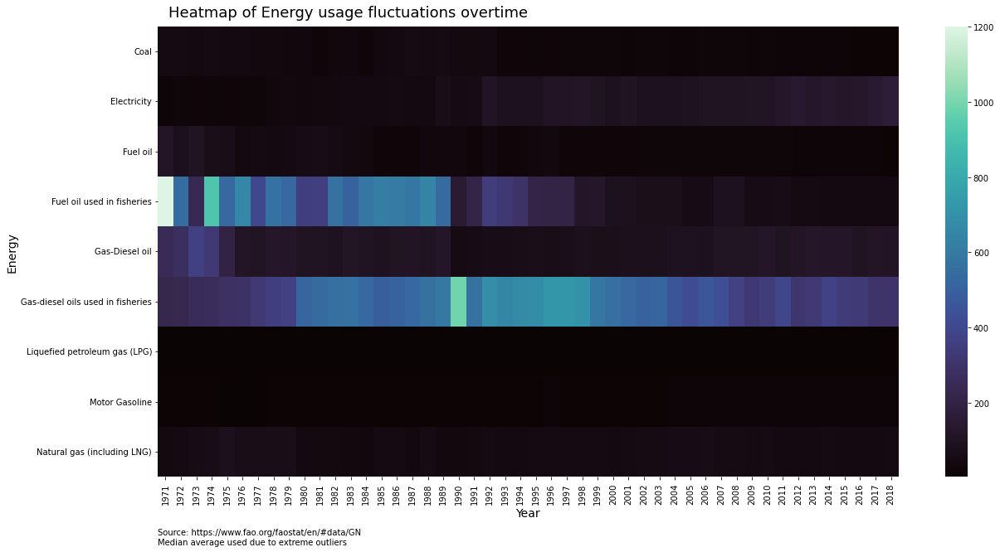

In [18]:
#Restructure data for visualisation
heat = energy.groupby(["Item", "Year"])["Value"].median().unstack()
heat.dropna(inplace = True)

#Construct visualisation 
plt.figure(figsize = (20,10))
sns.heatmap(heat, cmap = "mako")

#customisation
plt.ylabel("Energy", fontsize=14)
plt.xlabel("Year", fontsize=14)
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN \nMedian average used due to extreme outliers', (0,-.15), xycoords ='axes fraction' )
plt.title("Heatmap of Energy usage fluctuations overtime", fontsize = 18, horizontalalignment = "right", y=1.01 )

plt.show()

## G7

In [19]:
g7_countries = ( "UK", "USA", "Canada", "Japan", "Germany", "France", "Italy")

g7 = extract_country_data(Country_list = g7_countries, Dataset = energy)


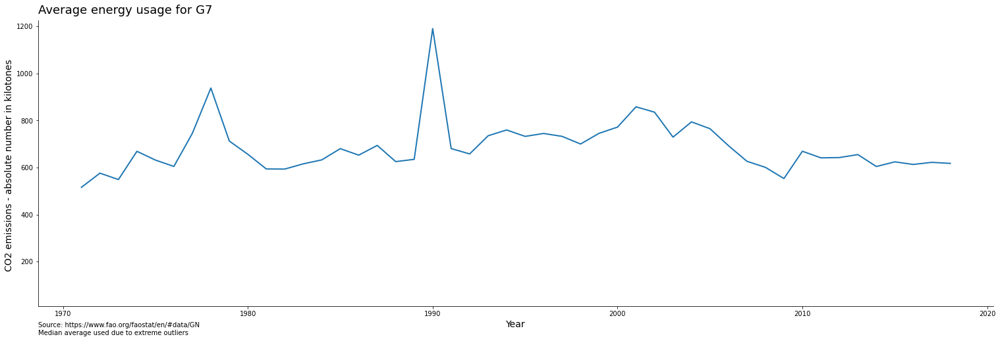

In [20]:
#Restructure data for visualisation
G7_Overview = restructure_data(g7, "Year", "Value")

#Construct visualisation 
plt.figure(figsize = (26,8))
sns.lineplot(x = "Year", y = "Value", data = G7_Overview, lw= 2)

#customisation
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN \nMedian average used due to extreme outliers', (0,-.1), xycoords ='axes fraction' )
plt.ylim(10,)
sns.despine(top = True, right = True, left = False, bottom = False)
plt.title("Average energy usage for G7", fontsize = 18, loc='left', y=1.01 )
plt.xlabel("Year", fontsize=14)
plt.ylabel("CO2 emissions - absolute number in kilotones ", fontsize=14)

plt.show()

In [21]:
#Construct visualisation 
fig =px.line(G7_Overview, x="Year", y= "Value", title = "Average energy usage for G7(interactive)" )

#customisation
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.update_xaxes(showline=True, linewidth=1, linecolor='black')
fig.update_yaxes(showline=True, linewidth=1, linecolor='black')

fig.add_annotation(text = ("Source: https://www.fao.org/faostat/en/#data/ET")
    , showarrow = False, x = 0, y = -0.15, xref = "paper", yref = "paper", xanchor = "left", yanchor = "bottom",
    xshift =-1, yshift =-5, font=dict(size=10, color = "grey"), align = "left")
fig.add_annotation(text = ("Source: https://www.fao.org/faostat/en/#data/ET"), showarrow= False, x= 0, y =-.15, 
                  xref = "paper", yref = "paper", xanchor="left", yanchor="bottom", xshift=-1, yshift=-5,
                  font=dict(size = 10, color = "grey"), 
                  align = "left")

#extracting plotly graphs 
#py.plot(fig, filename = "Average energy usage for G7(interactive)", auto_open = False)

fig.show()

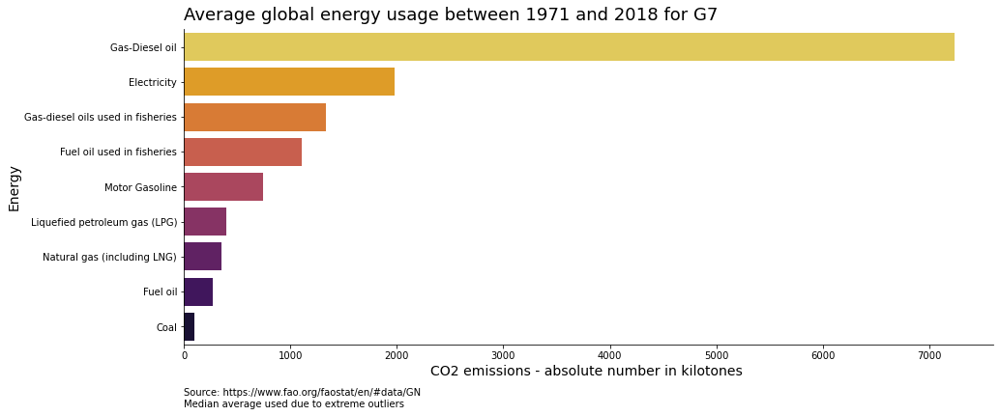

In [22]:
#Restructure data for visualisation
g7_avg = restructure_data(g7, "Item", "Value")

#Construct visualisation 
plt.figure(figsize = (15,6))
sns.barplot(y = "Item", x = "Value", data = g7_avg, order = g7_avg.sort_values("Value", ascending= False)["Item"], palette = "inferno_r")

#customisation
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN \nMedian average used due to extreme outliers', (0,-.2), xycoords ='axes fraction' )
sns.despine(top = True, right = True, left = False, bottom = False)
plt.title("Average global energy usage between 1971 and 2018 for G7", fontsize = 18, loc='left', y=1.01  )
plt.ylabel("Energy", fontsize=14)
plt.xlabel("CO2 emissions - absolute number in kilotones ", fontsize=14)

plt.show()

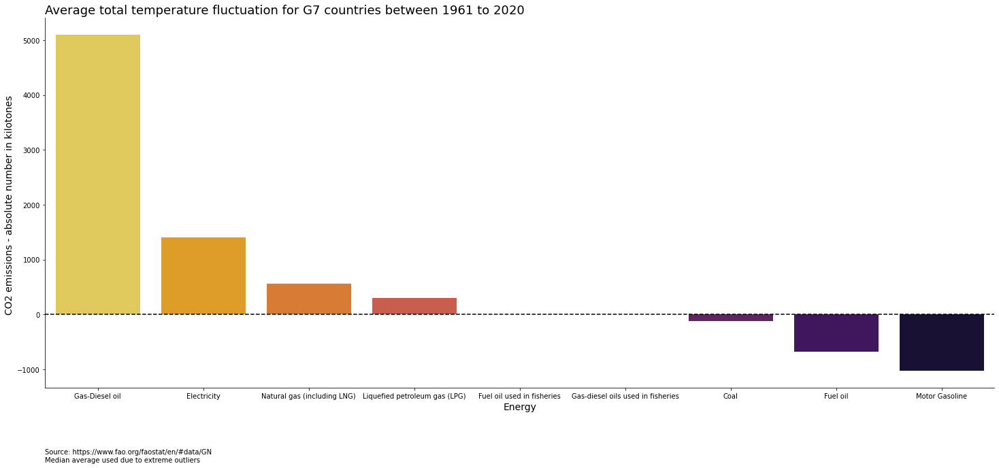

In [23]:
#Restructure data for visualisation
g7_comparison = comparison_of_min_max(g7)

#Construct visualisation 
plt.figure(figsize=(25,10))
sns.barplot(x = "Item", y = "Value", data = g7_comparison, order = g7_comparison.sort_values("Value", ascending= False)["Item"], palette = "inferno_r")

#customisation
plt.axhline(0, ls = "--", color = "black")
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN \nMedian average used due to extreme outliers', (0,-.2), xycoords ='axes fraction' )
sns.despine(top = True, right = True, left = False, bottom = False)
plt.title("Average total temperature fluctuation for G7 countries between 1961 to 2020", fontsize = 18, loc = "left")

plt.xlabel("Energy", fontsize=14)
plt.ylabel("CO2 emissions - absolute number in kilotones ", fontsize=14)
plt.show()

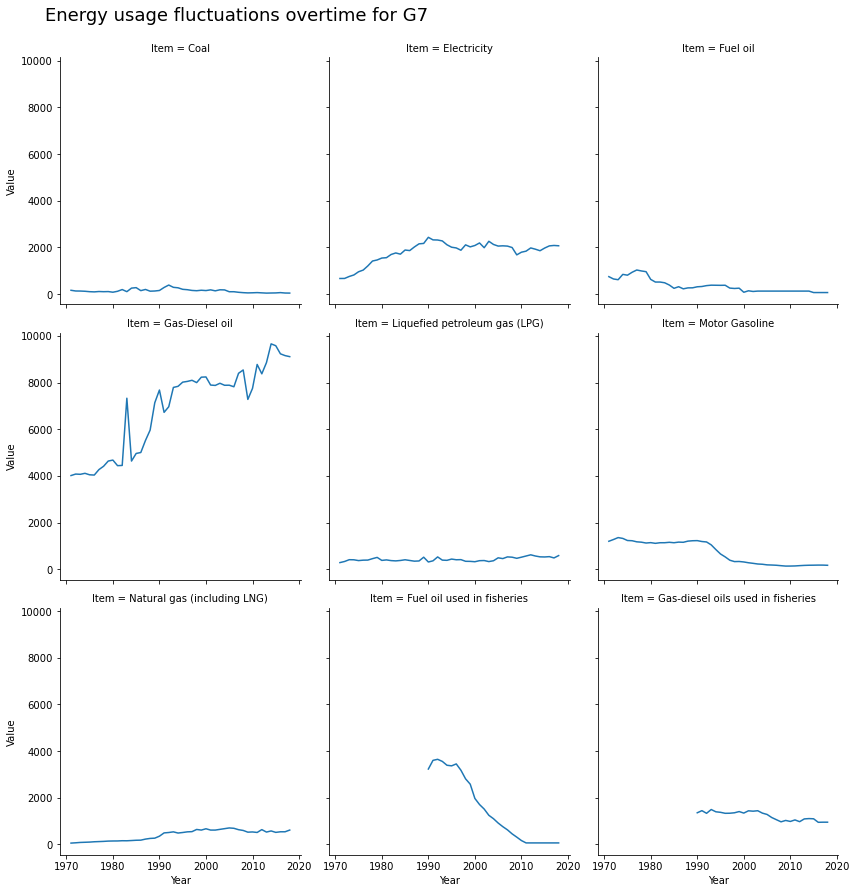

In [24]:
#Restructure data for visualisation
g7_fluctuations = restructure_data(g7,["Year", "Item"], "Value").reset_index()

#Construct visualisation 
g= sns.FacetGrid(data = g7_fluctuations, col = "Item", col_wrap = 3, height = 4)
g.map(sns.lineplot, "Year", "Value",)
g.fig.suptitle('Energy usage fluctuations overtime for G7',fontsize = 18, horizontalalignment='right', y = 1.03)

plt.show()

In [25]:
#Construct visualisation 
fig = px.line(g7_fluctuations, x = "Year", y = "Value", facet_col = "Item", facet_row_spacing=0.04, 
              facet_col_wrap=2, width=800, height=2000,
             title = "Energy usage in average CO2 emissions for G7 separated by energy")

#customisation
fig.update_xaxes(matches = None, showline=True, linewidth=1, linecolor='black')
fig.update_yaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
}, showlegend = False)

#extracting plotly graphs 
#py.plot(fig, filename = "Energy usage in average CO2 emissions for G7 separated by energy", auto_open = False)

    
fig.show()


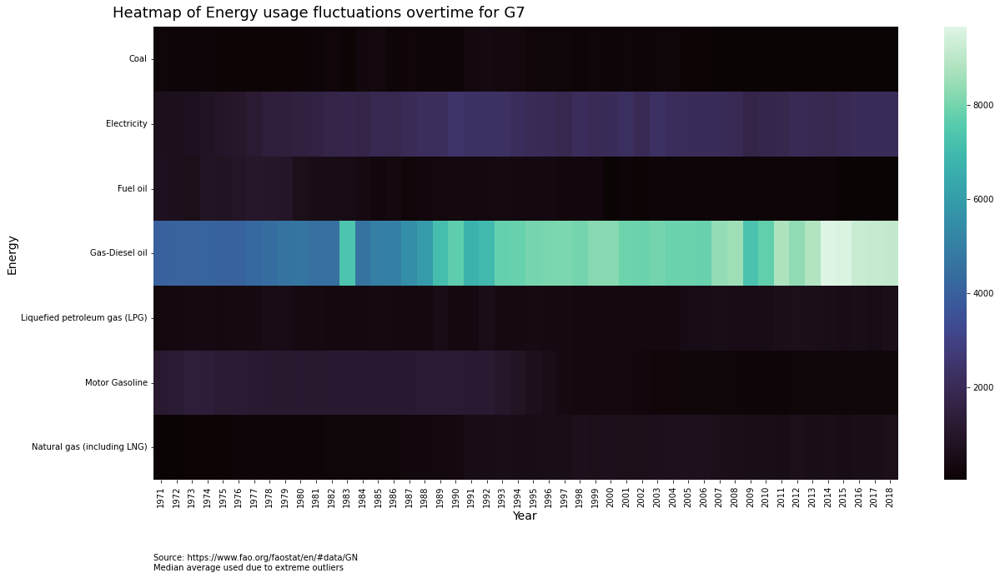

In [26]:
#Restructure data for visualisation
heat = g7.groupby(["Item", "Year"])["Value"].median().unstack()
heat.dropna(inplace = True)

#Construct visualisation 
plt.figure(figsize = (20,10))
sns.heatmap(heat, cmap = "mako")

#customisation
plt.xlabel("Year", fontsize=14)
plt.ylabel("Energy", fontsize=14)
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN \nMedian average used due to extreme outliers', (0,-.2), xycoords ='axes fraction' )
plt.title("Heatmap of Energy usage fluctuations overtime for G7", fontsize = 18, horizontalalignment = "right", y=1.01 )

plt.show()

## South America

In [27]:
South_America_countries = ["Argentina","Bolivia","Brazil","Chile","Colombia","Ecuador","French Guyana",
                 "Guyana","Paraguay","Peru","Suriname","Uruguay","Venezuela"]
# https://www.britannica.com/topic/list-of-countries-in-Latin-America-2061416

South_America = extract_country_data(Country_list = South_America_countries, Dataset = energy)



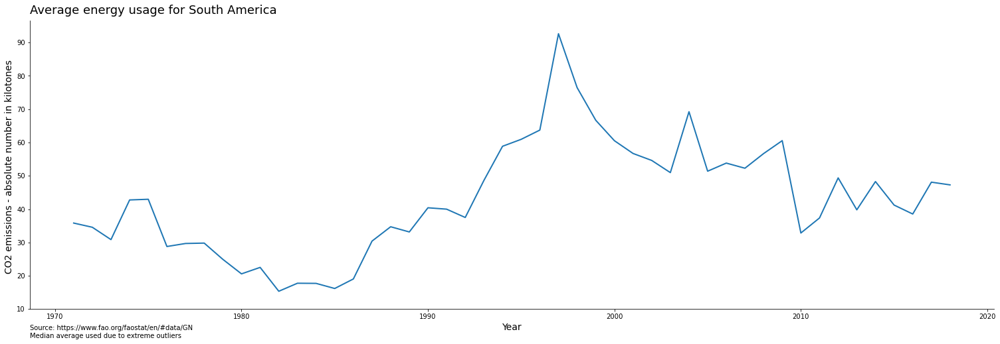

In [28]:
#Restructure data for visualisation
South_America_Overview = restructure_data(South_America, "Year", "Value").reset_index()

#Construct visualisation 
plt.figure(figsize = (26,8))
sns.lineplot(x = "Year", y = "Value", data = South_America_Overview, lw= 2)

#customisation
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN \nMedian average used due to extreme outliers', (0,-.1), xycoords ='axes fraction' )
plt.ylim(10,)
sns.despine(top = True, right = True, left = False, bottom = False)
plt.title("Average energy usage for South America", fontsize = 18, loc='left', y=1.01 )
plt.xlabel("Year", fontsize=14)
plt.ylabel("CO2 emissions - absolute number in kilotones ", fontsize=14)

plt.show()

In [29]:
#Construct visualisation 
fig =px.line(South_America_Overview, x="Year", y= "Value", title = "Average energy usage for South America(interactive)" )

#customisation
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.update_xaxes(showline=True, linewidth=1, linecolor='black')
fig.update_yaxes(showline=True, linewidth=1, linecolor='black')

fig.add_annotation(text = ("Source: https://www.fao.org/faostat/en/#data/ET")
    , showarrow = False, x = 0, y = -0.15, xref = "paper", yref = "paper", xanchor = "left", yanchor = "bottom",
    xshift =-1, yshift =-5, font=dict(size=10, color = "grey"), align = "left")
fig.add_annotation(text = ("Source: https://www.fao.org/faostat/en/#data/ET"), showarrow= False, x= 0, y =-.15, 
                  xref = "paper", yref = "paper", xanchor="left", yanchor="bottom", xshift=-1, yshift=-5,
                  font=dict(size = 10, color = "grey"), 
                  align = "left")

#extracting plotly graphs 
#py.plot(fig, filename = "Average energy usage for South America(interactive)", auto_open = False)


fig.show()

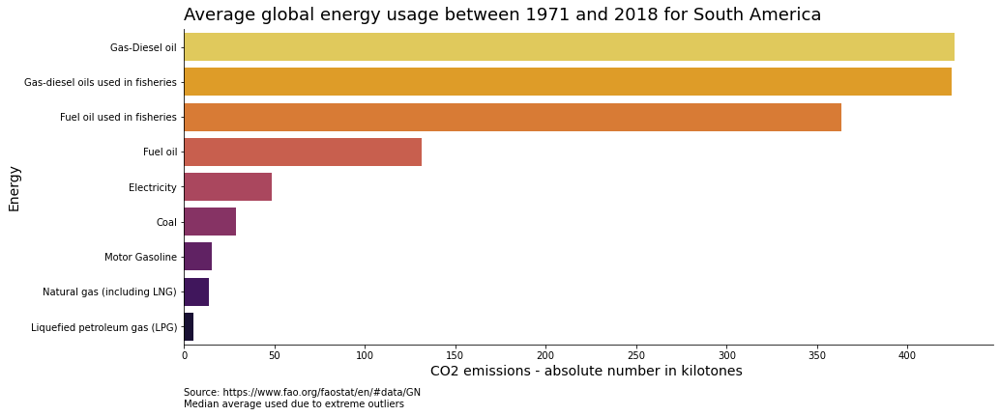

In [30]:
#Restructure data for visualisation
South_America_avg = restructure_data(South_America, "Item", "Value").reset_index()

#Construct visualisation 
plt.figure(figsize = (15,6))
sns.barplot(y = "Item", x = "Value", data = South_America_avg, order = South_America_avg.sort_values("Value", ascending= False)["Item"], palette = "inferno_r")

#customisation
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN \nMedian average used due to extreme outliers', (0,-.2), xycoords ='axes fraction' )
sns.despine(top = True, right = True, left = False, bottom = False)
plt.title("Average global energy usage between 1971 and 2018 for South America", fontsize = 18, loc='left', y=1.01  )
plt.ylabel("Energy", fontsize=14)
plt.xlabel("CO2 emissions - absolute number in kilotones ", fontsize=14)

plt.show()

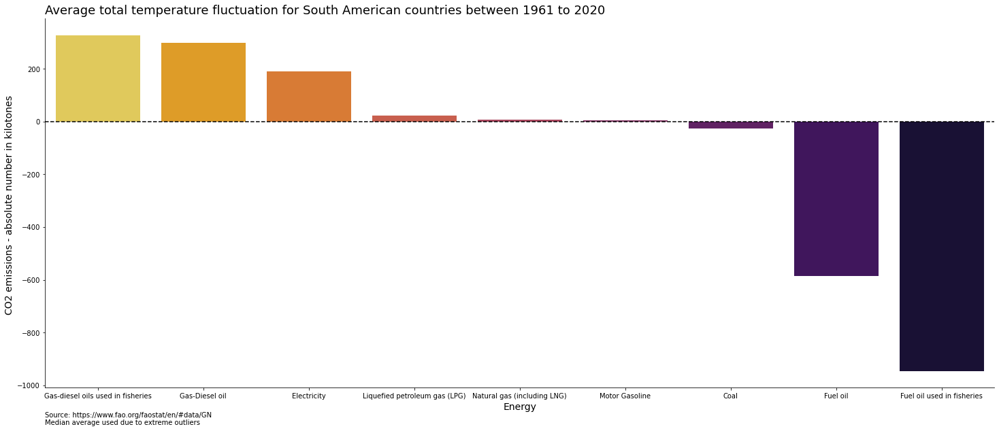

In [31]:
# Restructuring the data for visualisation 
South_America_comparison =comparison_of_min_max(South_America)

#Construct visualisation 
plt.figure(figsize=(25,10))
sns.barplot(x = "Item", y = "Value", data = South_America_comparison, order = South_America_comparison.sort_values("Value", ascending= False)["Item"], palette = "inferno_r")

#customisation
plt.xlabel("Energy", fontsize=14)
plt.ylabel("CO2 emissions - absolute number in kilotones ", fontsize=14)

plt.title("Average total temperature fluctuation for South American countries between 1961 to 2020", fontsize = 18, loc = "left")


plt.axhline(0, ls = "--", color = "black")
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN \nMedian average used due to extreme outliers', (0,-.1), xycoords ='axes fraction' )
sns.despine(top = True, right = True, left = False, bottom = False)

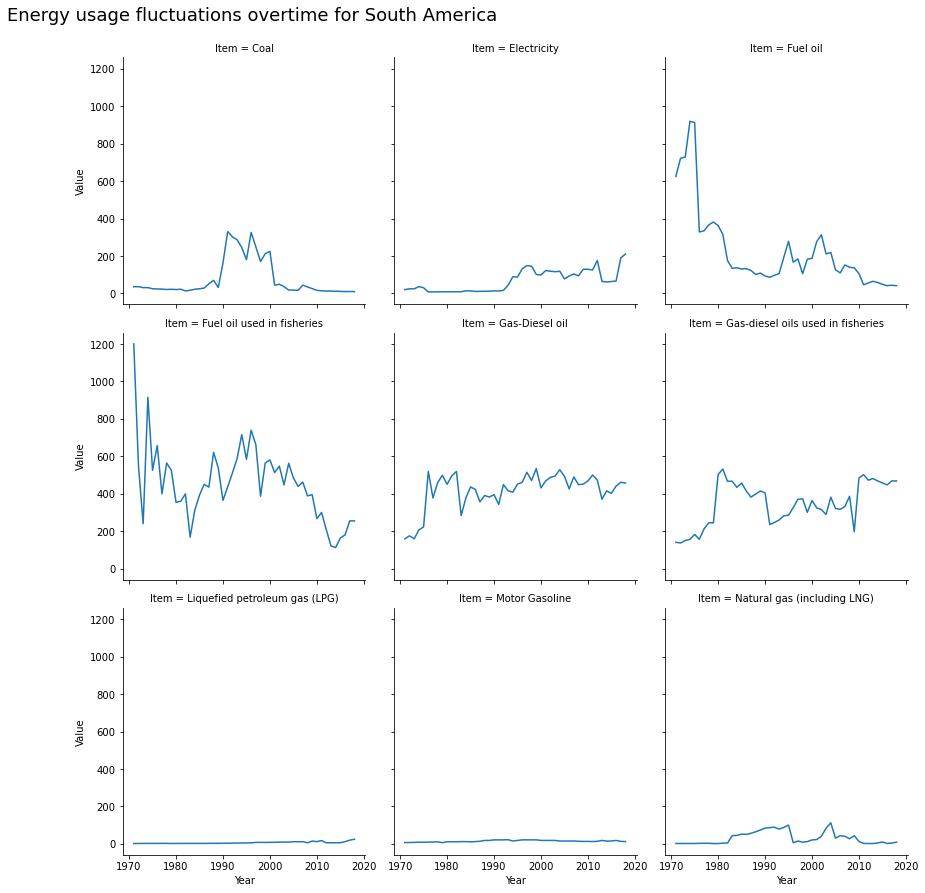

In [32]:
#Restructure data for visualisation
South_America_fluctuations = restructure_data(South_America, ["Year", "Item"], "Value").reset_index()

#Construct visualisation 
g= sns.FacetGrid(data = South_America_fluctuations, col = "Item", col_wrap = 3, height = 4)
g.map(sns.lineplot, "Year", "Value",)
g.fig.suptitle('Energy usage fluctuations overtime for South America',fontsize = 18, horizontalalignment='right', y = 1.03)
plt.show()

In [33]:
#Construct visualisation 
fig = px.line(South_America_fluctuations, x = "Year", y = "Value", facet_col = "Item", 
              facet_row_spacing=0.04, facet_col_wrap=2, width=800, height=2000,
             title = "Energy usage in average CO2 emissions for South America separated by energy")

#customisation
fig.update_xaxes(matches = None, showline=True, linewidth=1, linecolor='black')
fig.update_yaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
}, showlegend = False)
    
#extracting plotly graphs 
#py.plot(fig, filename = "Energy usage in average CO2 emissions for South America separated by energy", auto_open = False)

fig.show()

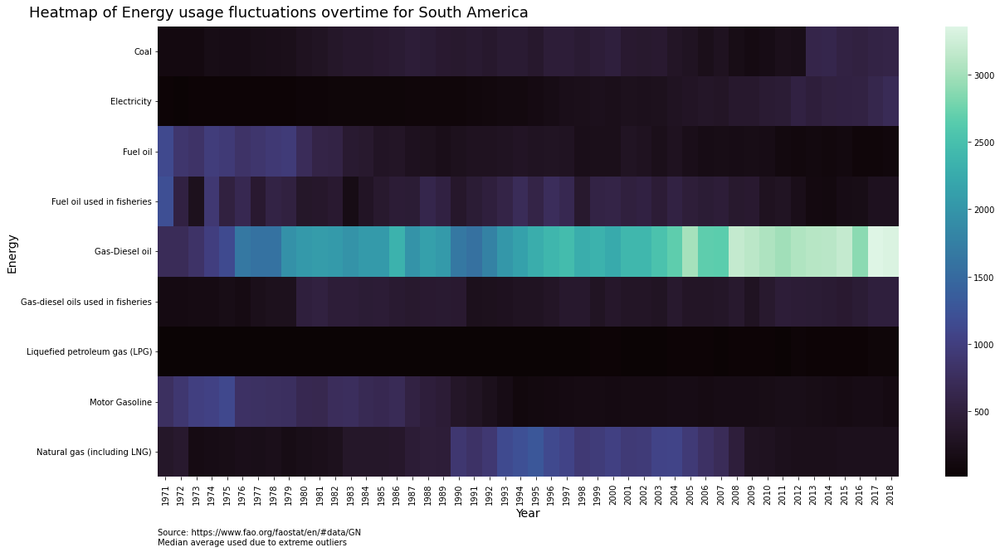

In [34]:
#Restructure data for visualisation
heat = South_America.groupby(["Item", "Year"])["Value"].mean().unstack()
heat.dropna(inplace = True)

#Construct visualisation 
plt.figure(figsize = (20,10))
sns.heatmap(heat, cmap = "mako")

#customisation
plt.xlabel("Year", fontsize=14)
plt.ylabel("Energy", fontsize=14)

plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN \nMedian average used due to extreme outliers', (0,-.15), xycoords ='axes fraction' )
plt.title("Heatmap of Energy usage fluctuations overtime for South America", fontsize = 18, horizontalalignment = "right", y=1.01 )
plt.show()

## Conclusion

## Appendix


### Understanding the dataset

In [35]:
data= pd.read_csv("energy_use_data_11-29-2021.csv")
data.head()

,Domain Code,Domain,Area Code (ISO3),Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,GN,Energy Use,AFG,Afghanistan,7273,Emissions (CO2),6801,Gas-Diesel oil,1990,1990,kilotonnes,231.4918,F,FAO estimate
1,GN,Energy Use,AFG,Afghanistan,7273,Emissions (CO2),6801,Gas-Diesel oil,1991,1991,kilotonnes,188.5317,F,FAO estimate
2,GN,Energy Use,AFG,Afghanistan,7273,Emissions (CO2),6801,Gas-Diesel oil,1992,1992,kilotonnes,47.9904,F,FAO estimate
3,GN,Energy Use,AFG,Afghanistan,7273,Emissions (CO2),6801,Gas-Diesel oil,1993,1993,kilotonnes,38.6116,F,FAO estimate
4,GN,Energy Use,AFG,Afghanistan,7273,Emissions (CO2),6801,Gas-Diesel oil,1994,1994,kilotonnes,31.4465,F,FAO estimate


In [36]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46131 entries, 0 to 46130
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Domain Code       46131 non-null  object 
 1   Domain            46131 non-null  object 
 2   Area Code (ISO3)  46131 non-null  object 
 3   Area              46131 non-null  object 
 4   Element Code      46131 non-null  int64  
 5   Element           46131 non-null  object 
 6   Item Code         46131 non-null  int64  
 7   Item              46131 non-null  object 
 8   Year Code         46131 non-null  int64  
 9   Year              46131 non-null  int64  
 10  Unit              46131 non-null  object 
 11  Value             46131 non-null  float64
 12  Flag              46131 non-null  object 
 13  Flag Description  46131 non-null  object 
dtypes: float64(1), int64(4), object(9)
memory usage: 4.9+ MB


#### Domain, Element and Unit

In [37]:
data["Domain Code"].value_counts()

GN    46131
Name: Domain Code, dtype: int64

In [38]:
data["Domain"].value_counts()

Energy Use    46131
Name: Domain, dtype: int64

In [39]:
data["Element Code"].value_counts()

7273    46131
Name: Element Code, dtype: int64

In [40]:
data["Element"].value_counts()

Emissions (CO2)    46131
Name: Element, dtype: int64

In [41]:
data["Unit"].value_counts()

kilotonnes    46131
Name: Unit, dtype: int64

#### Area

In [42]:
data["Area"].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia (Plurinational State of)',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon',
       'Canada', 'Cayman Islands', 'Central African Republic', 'Chad',
       'Channel Islands', 'Chile', 'China', 'China, Hong Kong SAR',
       'China, Macao SAR', 'China, mainland', 'China, Taiwan Province of',
       'Colombia', 'Comoros', 'Congo', 'Cook Islands', 'Costa Rica',
       "Côte d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia',
       'Czechoslovakia', "Democratic People's Republic of Korea",
       'Democratic Republic of the Congo', 'Denma

In [43]:
data.rename(columns = {"Area": "Country"}, inplace = True)

In [44]:
x = data[data["Country"]== "USSR"]["Year"].max()
print ("Most recent record for USSR is", x)

Most recent record for USSR is 1991


#### Duplicated data

In [45]:
sum(data["Year Code"]==data["Year"])==data.shape[0]

True

#### Year 

In [46]:
data_group = data.groupby(["Country", "Year"])["Value"].mean().reset_index()

print ("Oldest entry - ", data_group["Year"].min())

Oldest entry -  1970


In [47]:
print ("Newest entry - ", data_group["Year"].max())

Newest entry -  2019


In [48]:
x = data_group["Year"].to_numpy()
print ( "The dataset contains records for", np.ptp(x), "years, starting from", data_group["Year"].min(), "to", data_group["Year"].max())

The dataset contains records for 49 years, starting from 1970 to 2019


In [49]:
x = (data_group["Year"].max() +1) - data_group["Year"].min() == data_group["Year"].nunique()

print( "Are there Values for for every year between 1970 and 2019?", x)

Are there Values for for every year between 1970 and 2019? True


#### Item

In [50]:
data["Item"].value_counts()

Motor Gasoline                       8756
Gas-Diesel oil                       8160
Liquefied petroleum gas (LPG)        7431
Fuel oil                             6418
Electricity                          6061
Coal                                 4304
Natural gas (including LNG)          3787
Gas-diesel oils used in fisheries     747
Fuel oil used in fisheries            467
Name: Item, dtype: int64

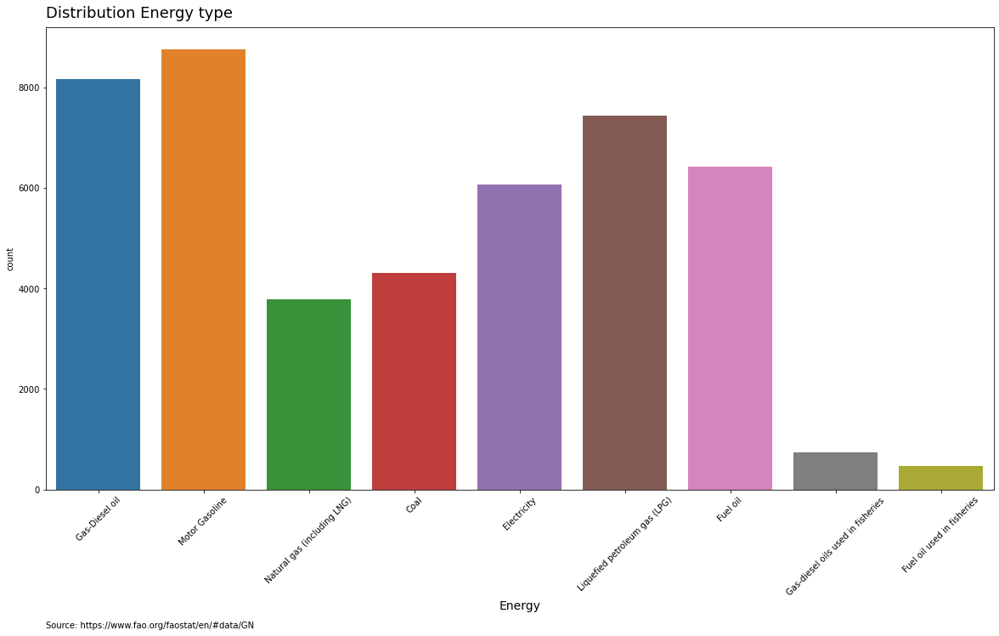

In [51]:
#Construct visualisation 
plt.figure(figsize = (20,10))
sns.countplot(x = "Item", data = data)

#customisation
plt.xlabel("Energy", fontsize=14)
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN', (0,-.3), xycoords ='axes fraction')
plt.title("Distribution Energy type", fontsize = 18, loc='left', y=1.01  )
plt.xticks(rotation=45)
plt.show()

In [52]:
pivot = pd.pivot_table(data, index = ["Year"], columns = ["Item"], values = ["Value"])
pivot.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50 entries, 1970 to 2019
Data columns (total 9 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   (Value, Coal)                               50 non-null     float64
 1   (Value, Electricity)                        50 non-null     float64
 2   (Value, Fuel oil)                           50 non-null     float64
 3   (Value, Fuel oil used in fisheries)         48 non-null     float64
 4   (Value, Gas-Diesel oil)                     50 non-null     float64
 5   (Value, Gas-diesel oils used in fisheries)  49 non-null     float64
 6   (Value, Liquefied petroleum gas (LPG))      50 non-null     float64
 7   (Value, Motor Gasoline)                     50 non-null     float64
 8   (Value, Natural gas (including LNG))        50 non-null     float64
dtypes: float64(9)
memory usage: 3.9 KB


In [53]:
pivot.isnull().iloc[:,[3, 5]]

Value                                  
Item Fuel oil used in fisheries Gas-diesel oils used in fisheries
Year                                                             
1970                       True                             False
1971                      False                             False
1972                      False                             False
1973                      False                             False
1974                      False                             False
1975                      False                             False
1976                      False                             False
1977                      False                             False
1978                      False                             False
1979                      False                             False
1980                      False                             False
1981                      False                             False
1982                      False                             False
1983                      False                             False
1984                      False                             False
1985                      False                             False
1986                      False                             False
1987                      False                             False
1988                      False                             False
1989                      False                             False
1990                      False                             False
1991                      False                             False
1992                      False                             False
1993                      False                             False
1994                      False                             False
1995                      False                             False
1996                      False                             False
1997                      False                             False
1998                      False                             False
1999                      False                             False
2000                      False                             False
2001                      False                             False
2002                      False                             False
2003                      False                             False
2004                      False                             False
2005                      False                             False
2006                      False                             False
2007                      False                             False
2008                      False                             False
2009                      False                             False
2010                      False                             False
2011                      False                             False
2012                      False                             False
2013                      False                             False
2014                      False                             False
2015                      False                             False
2016                      False                             False
2017                      False                             False
2018                      False                             False
2019                       True                              True

#### Flag description

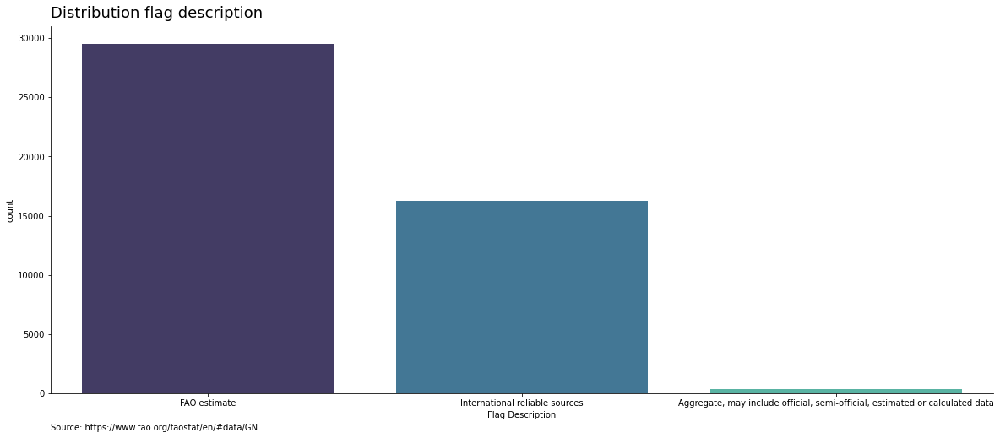

In [54]:
#Construct visualisation 
plt.figure(figsize = (20,8))
sns.countplot(x = "Flag Description", data = data, palette = "mako")

#customisation
sns.despine(top = True, right = True, left = False, bottom = False)
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN', (0,-.1), xycoords ='axes fraction')
plt.title("Distribution flag description", fontsize = 18, loc='left', y=1.01  )
plt.show()

In [55]:
(sum(data["Flag Description"]=="Aggregate, may include official, semi-official, estimated or calculated data")/data.shape[0])*100

0.858424920335566

In [56]:
(sum(data["Flag Description"]=='FAO estimate')/data.shape[0])*100

63.93314690771932

In [57]:
(sum(data["Flag Description"]=='International reliable sources')/data.shape[0])*100

35.20842817194511

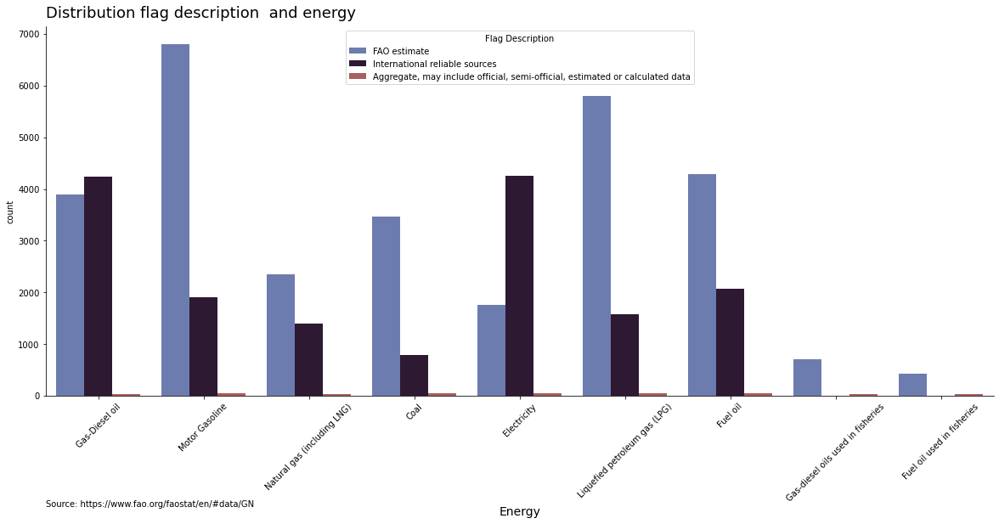

In [58]:
#Construct visualisation 
plt.figure(figsize = (20,8))
sns.countplot(x ="Item", hue= "Flag Description", data = data, palette = "twilight")

#customisation
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN', (0,-.3), xycoords ='axes fraction')
sns.despine(top = True, right = True, left = False, bottom = False)

plt.xlabel("Energy", fontsize=14)
plt.title("Distribution flag description  and energy", fontsize = 18, loc='left', y=1.01  )
plt.xticks(rotation=45)
plt.show()

#### Distribution of data

In [59]:
#Construct visualisation 
fig = px.histogram(data, x= "Value", color = "Item",  width = 1000)

#customisation
fig.update_layout(legend = dict(orientation = "h"))
fig.update_xaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')
fig.update_yaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')

fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
}, showlegend = False)

#extracting plotly graphs 
#py.plot(fig, filename = "Distribution of CO2 emissions seperated by energy type", auto_open = False)


fig.show()

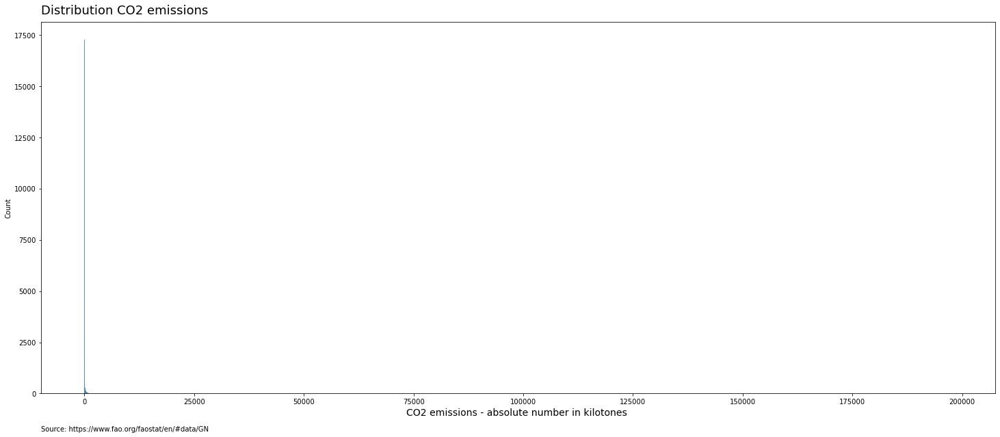

In [60]:
#Construct visualisation 
plt.figure(figsize = (25,10))
sns.histplot(x = "Value", data = data)

#customisation
plt.xlabel("CO2 emissions - absolute number in kilotones ", fontsize=14)
plt.title("Distribution CO2 emissions", fontsize = 18, loc='left', y=1.01  )
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN', (0,-.1), xycoords ='axes fraction')

plt.show()

In [61]:
#Construct visualisation 
fig = px.histogram(data, x= "Value", color = "Item", facet_col = "Item",
                   facet_row_spacing=0.04, facet_col_wrap=1, 
                   width=1000, height=2000,
                  title = "Distribution of CO2 emissions separated by energy ")

#customisation
fig.update_xaxes(matches = None)
fig.update_xaxes(showticklabels=True, )
fig.update_layout(showlegend = False)

fig.update_xaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')
fig.update_yaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')

fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
}, showlegend = False)

fig.show()

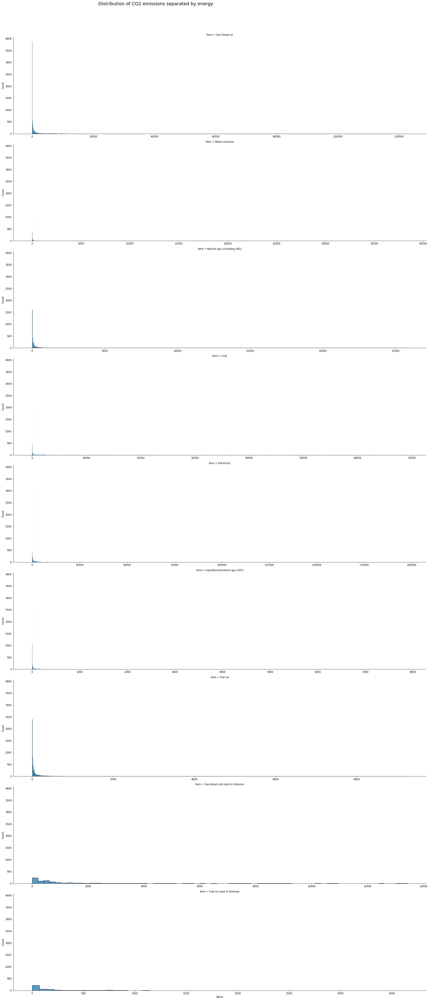

In [62]:
#Construct visualisation 
g= sns.FacetGrid(data = data, col = "Item", col_wrap = 1,margin_titles= False, height = 6,aspect = 4,  sharex=False)
g.map(sns.histplot, "Value",)

#customisation
g.fig.suptitle('Distribution of CO2 emissions separated by energy ',fontsize = 18, horizontalalignment='right', y = 1.03)
plt.show()

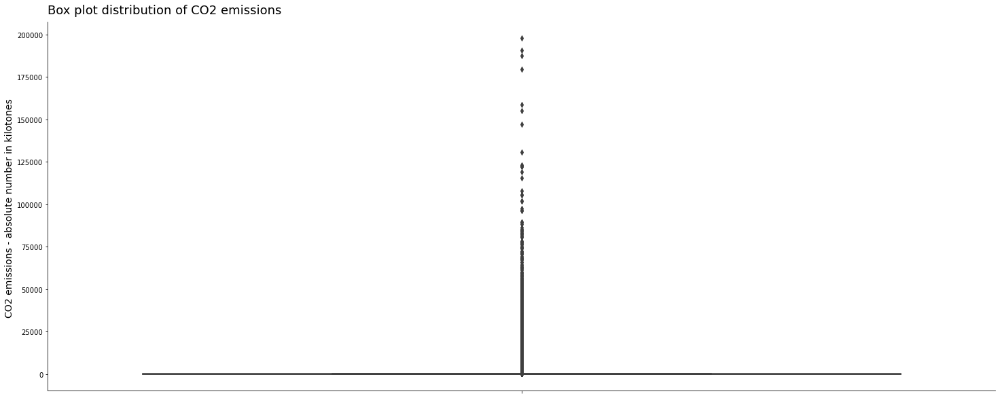

In [63]:
#Construct visualisation 
plt.figure(figsize = (25,10))
sns.boxplot(y = "Value", data = data)

#customisation
sns.despine(top = True, right = True, left = False, bottom = False)
plt.ylabel("CO2 emissions - absolute number in kilotones ", fontsize=14)
plt.title("Box plot distribution of CO2 emissions", fontsize = 18, loc='left', y=1.01  )

plt.show()

In [64]:
#Construct visualisation 
fig = px.box(data, x= "Item", y = "Value", title= "Box plot distribution of CO2 emissions")

#customisation
fig.update_xaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')
fig.update_yaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')

fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
}, showlegend = False)


Text(0.5, 0, 'Energy')

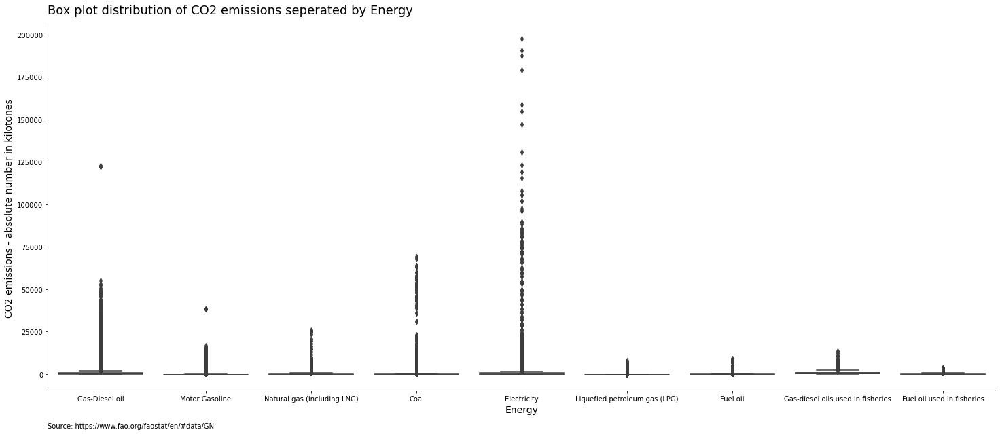

In [65]:
#Construct visualisation 
plt.figure(figsize = (25,10))
sns.boxplot(data= data, x= "Item", y = "Value")

#customisation
plt.annotate('Source: https://www.fao.org/faostat/en/#data/GN', (0,-.1), xycoords ='axes fraction' )
sns.despine(top = True, right = True, left = False, bottom = False)
plt.title("Box plot distribution of CO2 emissions seperated by Energy", fontsize = 18, loc='left', y=1.01  )


plt.ylabel("CO2 emissions - absolute number in kilotones ", fontsize=14)
plt.xlabel("Energy", fontsize=14)

In [66]:
#Restructure data for visualisation
data["Flag Description"].replace('Aggregate, may include official, semi-official, estimated or calculated data',"Aggregate", inplace =True)
data["Flag Description"].replace("International reliable sources", "International", inplace = True)

#Construct visualisation 
fig = px.box(data, x = "Flag Description", y = "Value", title = "Box plot distribution of CO2 emissions seperated by Flag Description")

#customisation
fig.update_xaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')
fig.update_yaxes(showticklabels=True, showline=True, linewidth=1, linecolor='black')

fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
}, showlegend = False)


Text(0, 0.5, 'CO2 emissions - absolute number in kilotones ')

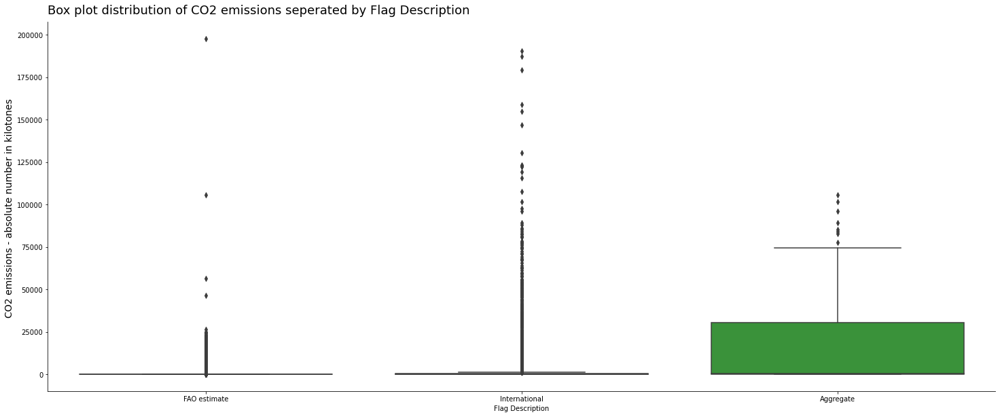

In [67]:
#Construct visualisation 
plt.figure(figsize = (25,10))
sns.boxplot(data =data, x = "Flag Description", y= "Value", )

#customisation
sns.despine(top = True, right = True, left = False, bottom = False)
plt.title("Box plot distribution of CO2 emissions seperated by Flag Description", fontsize = 18, loc='left', y=1.01  )

plt.ylabel("CO2 emissions - absolute number in kilotones ", fontsize=14)